In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


In [2]:
df=pd.read_csv(r"C:\Users\User\Desktop\temperature.csv")
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
df.shape

(7752, 25)

In [4]:
pd.set_option('display.max_rows',None)
df.head()


,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [6]:
df['station'].value_counts()

1.0     310
14.0    310
24.0    310
23.0    310
22.0    310
21.0    310
20.0    310
19.0    310
18.0    310
17.0    310
16.0    310
15.0    310
13.0    310
2.0     310
12.0    310
11.0    310
10.0    310
9.0     310
8.0     310
7.0     310
6.0     310
5.0     310
4.0     310
3.0     310
25.0    310
Name: station, dtype: int64

In [7]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [9]:
#checking the number of unique value in each column
df.nunique().to_frame("No.of unique values")

,No.of unique values
station,25
Date,310
Present_Tmax,167
Present_Tmin,155
LDAPS_RHmin,7672
LDAPS_RHmax,7664
LDAPS_Tmax_lapse,7675
LDAPS_Tmin_lapse,7675
LDAPS_WS,7675
LDAPS_LH,7675


### we can see that the datatypes of Date column is in object so we can change the data types of Date column into Datetime

In [10]:
#converting the datatype of Date column from object to datetime
df['Date']=pd.to_numeric(pd.to_datetime(df.Date))
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7752 non-null   int64  
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [11]:
df['station'].isnull()

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [12]:
df['Date'].min()

-9223372036854775808

In [13]:
df['Date'].max()

1512691200000000000

In [14]:
df['Date'].value_counts()

 1372550400000000000    25
 1468886400000000000    25
 1469491200000000000    25
 1469404800000000000    25
 1469318400000000000    25
 1469232000000000000    25
 1469145600000000000    25
 1469059200000000000    25
 1468972800000000000    25
 1468800000000000000    25
 1473206400000000000    25
 1468713600000000000    25
 1468627200000000000    25
 1468540800000000000    25
 1468454400000000000    25
 1468368000000000000    25
 1481068800000000000    25
 1478476800000000000    25
 1469577600000000000    25
 1469664000000000000    25
 1469750400000000000    25
 1469836800000000000    25
 1471132800000000000    25
 1471046400000000000    25
 1481155200000000000    25
 1478563200000000000    25
 1475884800000000000    25
 1473292800000000000    25
 1470614400000000000    25
 1467936000000000000    25
 1465344000000000000    25
 1462665600000000000    25
 1460073600000000000    25
 1457395200000000000    25
 1454889600000000000    25
 1452211200000000000    25
 1469923200000000000    25
 

In [15]:
df['Date'].tail(10)

7742    1504051200000000000
7743    1504051200000000000
7744    1504051200000000000
7745    1504051200000000000
7746    1504051200000000000
7747    1504051200000000000
7748    1504051200000000000
7749    1504051200000000000
7750   -9223372036854775808
7751   -9223372036854775808
Name: Date, dtype: int64

### wecan see that in the row number 7750,7751 in Date column the NaN value is present

In [16]:
df['station'].tail(10)

7742    18.0
7743    19.0
7744    20.0
7745    21.0
7746    22.0
7747    23.0
7748    24.0
7749    25.0
7750     NaN
7751     NaN
Name: station, dtype: float64

### wecan see that in the row number 7750,7751 in station column the NaN value is present

In [17]:
df.describe()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7.752000e+03,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,1.434571e+18,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,1.770487e+17,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,-9.223372e+18,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,1.405210e+18,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,1.438042e+18,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,1.471910e+18,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,1.512691e+18,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


##### from the above description we can observe the  following:-

##### The count of all value is not  same which means there is  missing values in the dataset.

##### The median(50%)value is grater than the mean in LDAPS_RHmax,next_Tmax,Next_Tmin columns which means the data is skewed to left in the column
.
##### By summarizing the data we can observe that  in some of the column there is a huge difference between 75% and max hence there are outliers present in the data.

##### we can also notice the standar devition ,minimum value ,25% percentile values from this describe.


### lets handle the missing value in the columns

In [18]:
df['station'].iloc[7750]=1.0
df['station'].iloc[7751]=2.0

In [19]:
df['Date'].iloc[7750]='31-08-2017'
df['Date'].iloc[7751]='31-08-2017'

In [20]:
for col in df.columns:
    if col not in ['station','Date']:
        df[col]=df[col].replace(np.nan,df[col].median())
    

In [21]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

### Lets See how the data is distributed in each of the column

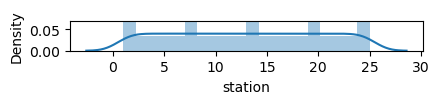

ValueError: could not convert string to float: '31-08-2017'

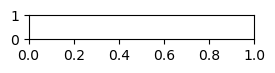

In [22]:
plt.figure(figsize=(10,6))
plotnumber=1

for col in df:
    if plotnumber<=26:
        ax=plt.subplot(13,2,plotnumber)
        sns.distplot(df[col])
        
        plotnumber+=1
        plt.show()

In [ ]:
df.skew()

### we can see that in some of the column data is skewed after plotting the boxplot if there is any outliers then removing the outliers we see that if the data is skewed or not

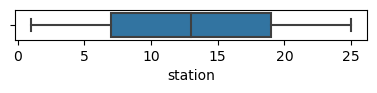

TypeError: Horizontal orientation requires numeric `x` variable.

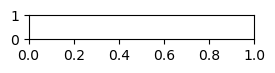

In [23]:
plt.figure(figsize=(10,6))
plotnumber=1

for col in df:
    if plotnumber<=26:
        ax=plt.subplot(13,2,plotnumber)
        sns.boxplot(df[col])
        
        plotnumber+=1
        plt.show()

### we can see there are outliers in present_Tmax,present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope

In [24]:
from scipy.stats import zscore
out_features=df[['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope']]
z=np.abs(zscore(out_features))
z

,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope
0,0.361725,0.760169,0.381088,0.525183,0.217678,0.125893,0.208564,0.302656,0.273714,0.238242,0.222227,2.772243,1.115004
1,0.720675,0.676937,0.309610,0.080598,0.222809,0.644345,0.313173,0.302656,0.273714,0.238242,0.222227,0.315157,0.542158
2,0.619200,0.030530,0.616784,0.162639,0.450160,0.439018,1.247488,0.302656,0.273714,0.238242,0.222227,0.526218,0.723133
3,0.754500,0.072146,1.130923,0.030795,0.080896,0.663593,0.097609,0.302656,0.273714,0.238242,0.222227,0.297588,0.932424
4,0.551550,0.552090,0.246800,0.170621,0.012213,0.624511,1.355851,0.302656,0.273714,0.238242,0.222227,0.494322,0.548433
5,0.720675,0.113761,0.430466,0.134679,0.131806,0.418744,0.363994,0.302656,0.273714,0.238242,0.222227,0.133199,0.810993
6,0.551550,0.488303,1.029444,0.362277,0.309982,0.692536,1.866569,0.302656,0.273714,0.238242,0.222227,0.911963,0.845437
7,0.788325,0.155377,1.450681,0.259941,0.130281,0.454570,0.608856,0.302656,0.273714,0.238242,0.222227,0.172266,0.223191
8,0.551550,0.510474,1.062296,0.404860,0.078241,0.494723,0.675035,0.302656,0.273714,0.238242,0.222227,0.201502,0.616299
9,0.619200,1.134710,0.214990,0.694785,0.423303,0.263923,0.016551,0.302656,0.273714,0.238242,0.222227,2.701715,2.861413


In [25]:
np.where(z>3)

(array([  25,   25,   26, ..., 7751, 7751, 7751], dtype=int64),
 array([ 5,  8,  8, ...,  8,  9, 10], dtype=int64))

In [26]:
df1=df[(z<3).all(axis=1)]
df1.shape

(6907, 25)

In [27]:
#shape of old and new DataFrame
print("old Data Frame-",df.shape[0])
print("New Data Frame-",df1.shape[0])

old Data Frame- 7752
New Data Frame- 6907


In [28]:
print("data loss percentage-",((df.shape[0]-df1.shape[0])/df.shape[0])*100)

data loss percentage- 10.900412796697626


In [29]:
df=df1

### After removing the outliers Lets see how the data is distributed in each of the column

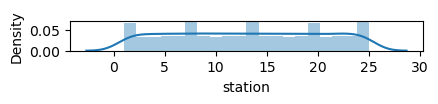

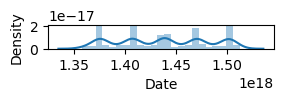

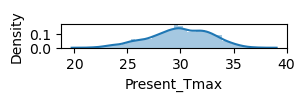

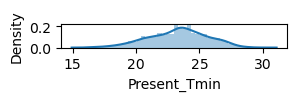

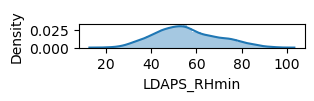

...

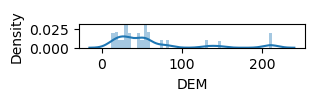

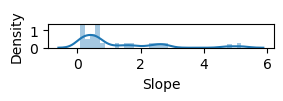

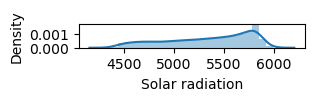

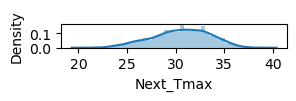

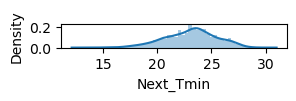

In [30]:
plt.figure(figsize=(10,6))
plotnumber=1

for col in df:
    if plotnumber<=26:
        ax=plt.subplot(13,2,plotnumber)
        sns.distplot(df[col])
        
        plotnumber+=1
        plt.show()

In [31]:
df.skew()

station             0.002230
Date                0.007558
Present_Tmax       -0.276259
Present_Tmin       -0.234662
LDAPS_RHmin         0.310704
LDAPS_RHmax        -0.691582
LDAPS_Tmax_lapse   -0.108929
LDAPS_Tmin_lapse   -0.400578
LDAPS_WS            1.095290
LDAPS_LH            0.571067
LDAPS_CC1           0.600816
LDAPS_CC2           0.507430
LDAPS_CC3           0.709766
LDAPS_CC4           0.721344
LDAPS_PPT1          3.753955
LDAPS_PPT2          4.874124
LDAPS_PPT3          5.517553
LDAPS_PPT4          5.974954
lat                 0.106291
lon                -0.276193
DEM                 1.761452
Slope               1.592353
Solar radiation    -0.503706
Next_Tmax          -0.271119
Next_Tmin          -0.294684
dtype: float64

### we can see that data is skewed in LDAPS_WS,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope columns

In [32]:
#removing skewness using cuberoot method
df['LDAPS_WS']=np.cbrt(df['LDAPS_WS'])

In [33]:
df['LDAPS_PPT1']=np.cbrt(df['LDAPS_PPT1'])

In [34]:
df['LDAPS_PPT2']=np.cbrt(df['LDAPS_PPT2'])

In [35]:
df['LDAPS_PPT3']=np.cbrt(df['LDAPS_PPT3'])

In [36]:
df['LDAPS_PPT4']=np.cbrt(df['LDAPS_PPT4'])

In [37]:
df['DEM']=np.cbrt(df['DEM'])

In [38]:
df['Slope']=np.cbrt(df['Slope'])

In [39]:
df.skew()

station             0.002230
Date                0.007558
Present_Tmax       -0.276259
Present_Tmin       -0.234662
LDAPS_RHmin         0.310704
LDAPS_RHmax        -0.691582
LDAPS_Tmax_lapse   -0.108929
LDAPS_Tmin_lapse   -0.400578
LDAPS_WS            0.625864
LDAPS_LH            0.571067
LDAPS_CC1           0.600816
LDAPS_CC2           0.507430
LDAPS_CC3           0.709766
LDAPS_CC4           0.721344
LDAPS_PPT1          1.937382
LDAPS_PPT2          2.354722
LDAPS_PPT3          2.518746
LDAPS_PPT4          2.874033
lat                 0.106291
lon                -0.276193
DEM                 0.933941
Slope               0.621259
Solar radiation    -0.503706
Next_Tmax          -0.271119
Next_Tmin          -0.294684
dtype: float64

### The corelation between targetvariable and features

In [40]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.110141,0.132613,-0.067640,-0.171526,0.066611,0.104061,0.023600,-0.135128,0.009338,...,-0.015448,-0.005574,0.005926,-0.239847,-0.121894,-0.291982,-0.131155,-0.028687,0.106798,0.128651
Present_Tmax,0.110141,1.000000,0.614380,-0.149972,-0.289408,0.535619,0.611513,-0.095746,0.125724,-0.285971,...,-0.083454,-0.033238,-0.039743,-0.049989,0.010601,-0.155107,-0.096224,-0.061707,0.587036,0.615868
Present_Tmin,0.132613,0.614380,1.000000,0.152038,-0.031417,0.436464,0.756550,0.020400,-0.009796,0.089299,...,0.098809,0.030767,-0.073515,-0.071073,-0.044843,-0.247979,-0.158044,0.015663,0.448798,0.786085
LDAPS_RHmin,-0.067640,-0.149972,0.152038,1.000000,0.553201,-0.552028,0.135798,0.215151,-0.039622,0.576626,...,0.517085,0.406848,0.253646,0.088434,-0.095051,0.080313,0.094873,0.252988,-0.426550,0.137941
LDAPS_RHmax,-0.171526,-0.289408,-0.031417,0.553201,1.000000,-0.384082,-0.134150,0.076857,0.268954,0.411938,...,0.342120,0.208632,0.122158,0.198735,0.016600,0.172479,0.199391,0.154460,-0.294961,-0.086986
LDAPS_Tmax_lapse,0.066611,0.535619,0.436464,-0.552028,-0.384082,1.000000,0.620526,-0.204249,0.035493,-0.415515,...,-0.340612,-0.271654,-0.219829,-0.036965,0.102270,-0.146278,-0.123547,0.015016,0.806520,0.547084
LDAPS_Tmin_lapse,0.104061,0.611513,0.756550,0.135798,-0.134150,0.620526,1.000000,-0.038472,-0.138550,0.040998,...,0.034851,-0.009315,-0.098324,-0.088831,-0.030814,-0.183267,-0.167745,0.111543,0.541675,0.869542
LDAPS_WS,0.023600,-0.095746,0.020400,0.215151,0.076857,-0.204249,-0.038472,1.000000,-0.051837,0.242298,...,0.177103,0.141896,0.210198,-0.018799,-0.075784,0.139046,0.108719,0.140292,-0.252920,-0.002991
LDAPS_LH,-0.135128,0.125724,-0.009796,-0.039622,0.268954,0.035493,-0.138550,-0.051837,1.000000,-0.145251,...,-0.093955,-0.014745,0.020140,0.123888,0.023431,0.051002,0.053088,-0.037899,0.167809,-0.053499
LDAPS_CC1,0.009338,-0.285971,0.089299,0.576626,0.411938,-0.415515,0.040998,0.242298,-0.145251,1.000000,...,0.574766,0.301137,0.238990,-0.006142,-0.014123,-0.028307,-0.031715,0.243170,-0.448912,0.011251


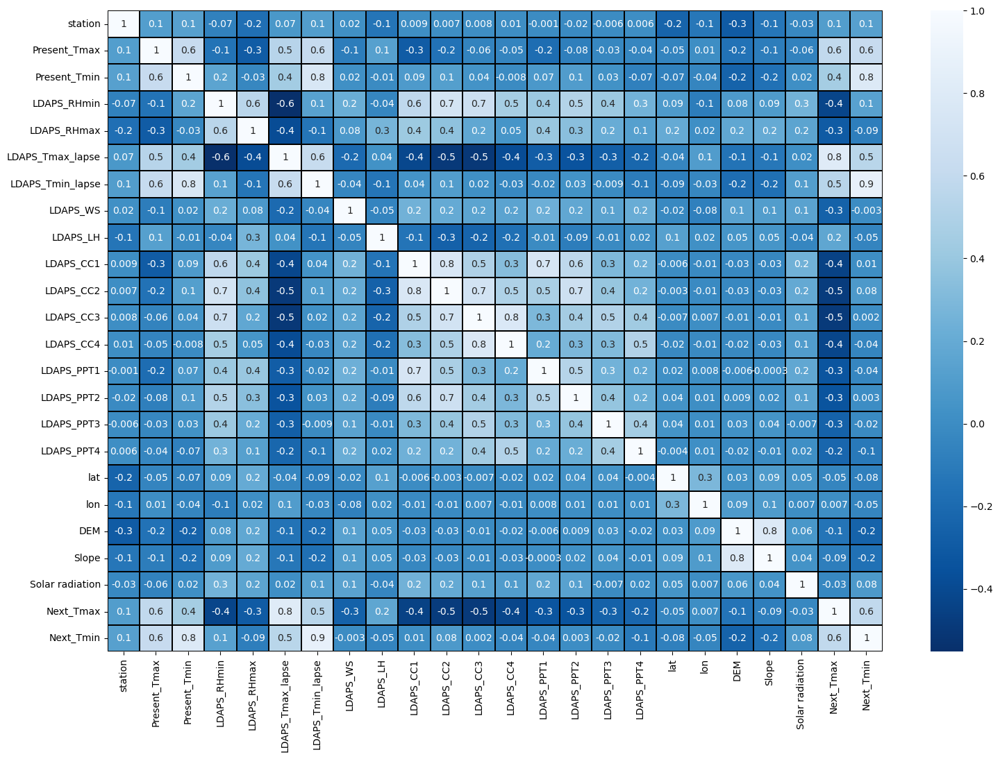

In [41]:
plt.figure(figsize=(18,12))
sns.heatmap(df.corr(),linewidths=0.1,fmt=".1g",linecolor="black",annot=True,cmap="Blues_r")
plt.show()

### This heatmap show the corelation matrix by visualizing the data .we can observe the relation between feature to feature and feature to lable in the heat map.

### This heatmap contains both positive and negative corelation.

### we can see that the features Present_Tmax,Present_Tmin,LDAPS_Tmin_lapse, are very much positively corelated with lable Next_Tmin.

### we can see that the features Present_Tmax,LDAPS_Tmax_lapse highly positive corelated with lable Next_Tmax.

### we cans see that the features lat and lon are very much less contribute to the lable Next_Tmax and also the lable Next_Tmin.

### we can see that the features DEM and Slope,Present_Tmin and LADPS_Tmin_lapse, and LADPS_CC2and LADPS_CC1,LADPS_CC3and LADPS_CC4, features are highly positively related with each other.

### From the above see can see that if  there is multicolinearity issue present in this dataset or not.

### visualizing the corelation between lable and features using barplot

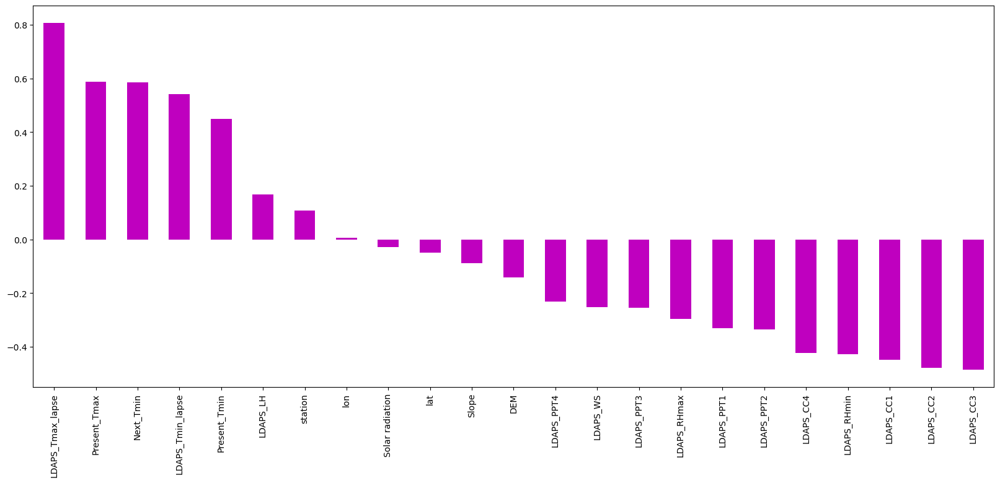

In [44]:
plt.figure(figsize=(20,8))
df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='m')
plt.show()

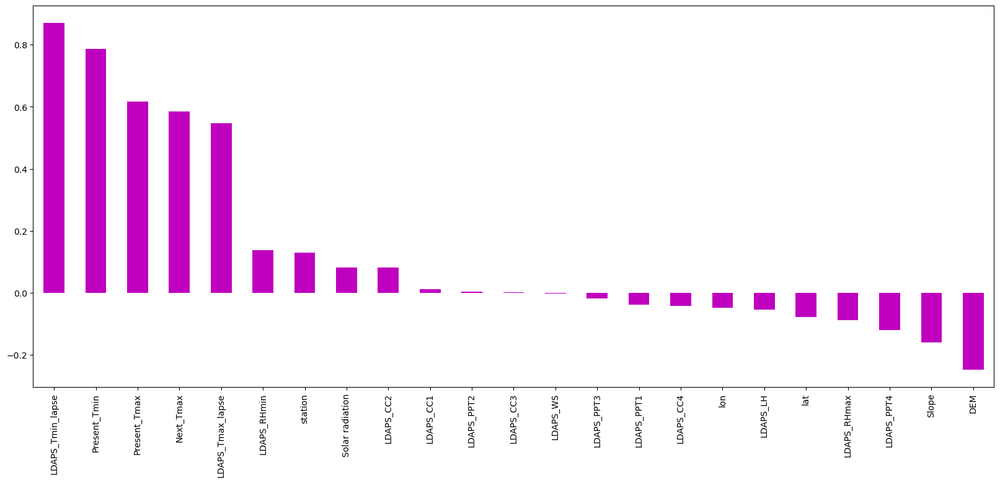

In [43]:
plt.figure(figsize=(20,8))
df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='m')
plt.show()

In [48]:
x=df.drop(["Next_Tmax","Next_Tmin"],axis=1)
y=df[['Next_Tmax','Next_Tmin']]

print(x.shape)
print(y.shape)

(6907, 23)
(6907, 2)


In [49]:
scaler=StandardScaler()
x_scaled=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x_scaled

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.671979,-1.446238,-0.431194,-0.822452,0.194568,0.435512,-0.659731,-0.285480,0.062724,0.224964,...,-0.616232,-0.536462,-0.482345,-0.462395,-0.404514,1.212696,0.001303,2.362315,1.292359,1.551286
1,-1.533033,-1.446238,0.688333,-0.736044,-0.238702,0.361532,-0.010439,0.176037,-0.624333,-0.301711,...,-0.629876,-0.536462,-0.482345,-0.462395,-0.404514,1.212696,0.516019,-0.137558,-0.415548,1.257647
2,-1.394087,-1.446238,0.583377,-0.001570,-0.497040,-0.597282,0.077494,0.414242,-0.342244,-1.244871,...,-0.568504,-0.536462,-0.482345,-0.462395,-0.404514,0.672910,0.842425,-0.482410,-0.860644,1.243968
3,-1.255141,-1.446238,0.723318,0.041634,0.193418,1.211588,-0.063820,-0.142168,-0.651523,0.112960,...,-0.602078,-0.536462,-0.482345,-0.462395,-0.404514,2.020375,0.390479,-0.111644,1.169840,1.228308
4,-1.116195,-1.446238,0.513407,-0.606431,0.044059,0.296524,-0.279702,-0.070205,-0.596455,1.383112,...,-0.449596,-0.536462,-0.482345,-0.462395,-0.404514,0.135124,1.809087,-0.425683,-0.428212,1.234456
5,-0.977249,-1.446238,0.688333,0.084839,-0.226141,-0.404444,-0.241178,0.080690,-0.315141,-0.353014,...,-0.550440,-0.536462,-0.482345,-0.462395,-0.404514,-0.674555,0.641560,0.114969,-1.190474,1.268264
6,-0.838303,-1.446238,0.513407,0.473678,0.052236,-1.024384,-0.485124,0.267373,-0.692663,1.898665,...,-0.553243,-0.536462,-0.482345,-0.462395,-0.404514,0.672910,-1.919467,-1.418832,-1.371954,1.209938
7,-0.699357,-1.446238,0.758304,0.128043,-0.234160,-1.460363,-0.375438,0.079092,-0.363122,-0.600193,...,-0.561192,-0.536462,-0.482345,-0.462395,-0.404514,-1.484233,-1.015575,0.063490,0.597627,1.245006
8,-0.560411,-1.446238,0.513407,-0.563226,-0.016337,-1.058386,-0.530765,-0.139386,-0.417384,0.695852,...,-0.539578,-0.536462,-0.482345,-0.462395,-0.404514,-0.944448,-2.070116,0.024052,-0.575359,1.275678
9,-0.421465,-1.446238,0.583377,-1.211291,0.078556,-0.181427,-0.841515,-0.500922,-0.112306,0.031134,...,-0.596985,-0.536462,-0.482345,-0.462395,-0.404514,-1.754126,-0.450643,2.324983,2.203235,1.315375


### Checking The variance influance factor

In [50]:
#finding the vif in scaleed column the formula is (1/1-R2)
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x_scaled.values,i) for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,1.244616,station
1,1.139370,Date
2,2.719836,Present_Tmax
3,3.066994,Present_Tmin
4,5.899234,LDAPS_RHmin
5,2.288574,LDAPS_RHmax
6,6.842638,LDAPS_Tmax_lapse
7,6.838291,LDAPS_Tmin_lapse
8,1.228731,LDAPS_WS
9,1.540778,LDAPS_LH


### we can see that all the VIF values are less than 10 so there is no multicolinearity issue present in the data set

In [51]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression

### Finding the best Random State

In [52]:
maxAccu=0
maxRS=0
for i in range(1,300):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=.30,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("maximum r2 score is ",maxAccu,"on Random state",maxRS)        
        

maximum r2 score is  0.7954384020424483 on Random state 222


In [53]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=maxRS)

In [54]:
LR=LinearRegression()
LR.fit(x_train,y_train)
pred_LR=LR.predict(x_test)
pred_train=LR.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_LR))
print('R2_SCORE ON TRAINING DATa',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_LR))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_LR))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_LR)))

R2_SCORE 0.7954384020424483
R2_SCORE ON TRAINING DATa 0.7762258027651108
MEAN ABSOLUTE ERROR:- 0.9387789854310808
MEAN SQUARED ERROR:- 1.5385998697573584
ROOT MEAN SQUARED ERROR:- 1.2404031077667286


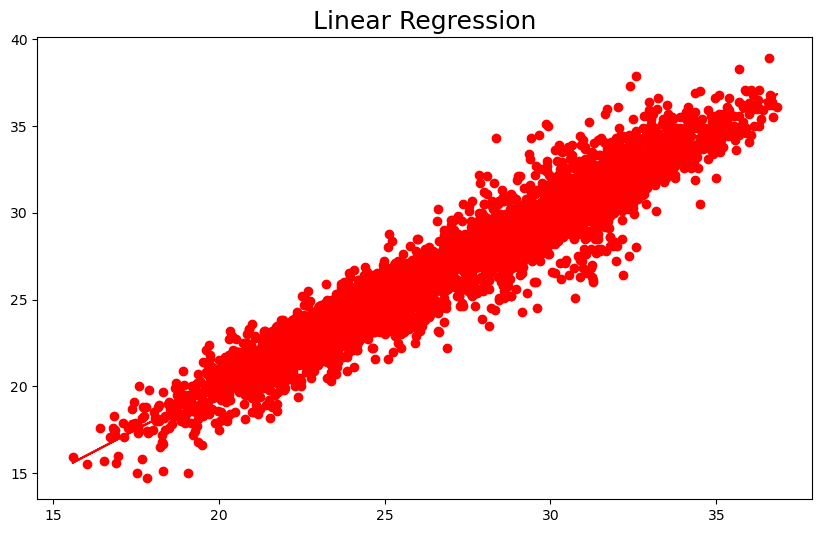

In [55]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_LR,y=y_test,color='r')
plt.plot(pred_LR,pred_LR,color='r')
plt.title("Linear Regression",fontsize=18)
plt.show()

In [65]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge
from sklearn.ensemble import AdaBoostRegressor,BaggingRegressor
from sklearn.svm import SVR

In [57]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR=RFR.predict(x_test)
pred_train=RFR.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_RFR))
print('R2_SCORE ON TRAINING DATa',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_RFR))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_RFR))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_RFR)))

R2_SCORE 0.8923804470813712
R2_SCORE ON TRAINING DATa 0.9837874074455146
MEAN ABSOLUTE ERROR:- 0.6680916546068497
MEAN SQUARED ERROR:- 0.7851929150988903
ROOT MEAN SQUARED ERROR:- 0.8861111189342398


In [58]:
DT=DecisionTreeRegressor()
DT.fit(x_train,y_train)
pred_DT=DT.predict(x_test)
pred_train=DT.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_DT))
print('R2_SCORE ON TRAINING DATa',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_DT))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_DT))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_DT)))

R2_SCORE 0.7344413310015125
R2_SCORE ON TRAINING DATa 1.0
MEAN ABSOLUTE ERROR:- 1.016425470332849
MEAN SQUARED ERROR:- 1.967667631452005
ROOT MEAN SQUARED ERROR:- 1.4027357667971558


In [59]:
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_knn))
print('R2_SCORE ON TRAINING DATA',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_knn))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_knn))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_knn)))

R2_SCORE 0.8660196349648459
R2_SCORE ON TRAINING DATA 0.9039947902360017
MEAN ABSOLUTE ERROR:- 0.7508538350217049
MEAN SQUARED ERROR:- 0.9842128316449601
ROOT MEAN SQUARED ERROR:- 0.9920750131139077


In [69]:
lasso=Lasso()
lasso.fit(x_train,y_train)
pred_lasso=lasso.predict(x_test)
pred_train=lasso.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_lasso))
print('R2_SCORE ON TRAINING DATA',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_lasso))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_lasso))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_lasso)))

R2_SCORE 0.5707831011584783
R2_SCORE ON TRAINING DATA 0.5552195786637897
MEAN ABSOLUTE ERROR:- 1.3949474270276259
MEAN SQUARED ERROR:- 3.1885059910225335
ROOT MEAN SQUARED ERROR:- 1.7856388187487786


In [68]:
rd=Ridge()
rd.fit(x_train,y_train)
pred_rd=rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_rd))
print('R2_SCORE ON TRAINING DATa',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_rd))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_rd))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_rd)))

R2_SCORE 0.7954372373905221
R2_SCORE ON TRAINING DATa 0.7762257254325565
MEAN ABSOLUTE ERROR:- 0.9387762475898203
MEAN SQUARED ERROR:- 1.5386210707676864
ROOT MEAN SQUARED ERROR:- 1.240411653753578


In [71]:
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()
etr.fit(x_train,y_train)
pred_etr=etr.predict(x_test)
pred_train=etr.predict(x_train)
print('R2_SCORE',r2_score(y_test,pred_etr))
print('R2_SCORE ON TRAINING DATa',r2_score(y_train,pred_train))
print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred_etr))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred_etr))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred_etr)))


R2_SCORE 0.9109493345254991
R2_SCORE ON TRAINING DATa 1.0
MEAN ABSOLUTE ERROR:- 0.6031261456825836
MEAN SQUARED ERROR:- 0.6484061357935353
ROOT MEAN SQUARED ERROR:- 0.8052366955085538


In [73]:
from sklearn.model_selection import cross_val_score

In [74]:
score=cross_val_score(LR,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_LR) - score.mean())*100)

[0.69470041 0.65570134 0.73133934 0.76276634 0.64568188]
0.6980378597190924
Difference between R2 score and cross validation score is -  9.740054232335593


In [75]:
score=cross_val_score(RFR,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_RFR) - score.mean())*100)

[0.65926509 0.64438055 0.70627819 0.7808644  0.69163934]
0.6964855157089591
Difference between R2 score and cross validation score is -  19.58949313724121


In [76]:
score=cross_val_score(DT,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_DT) - score.mean())*100)

[0.28888575 0.31676092 0.40897568 0.61075344 0.40079008]
0.4052331767591738
Difference between R2 score and cross validation score is -  32.92081542423387


In [77]:
score=cross_val_score(knn,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_knn) - score.mean())*100)

[0.4948856  0.43843109 0.5757473  0.60946089 0.60484313]
0.5446736031036749
Difference between R2 score and cross validation score is -  32.134603186117104


In [78]:
score=cross_val_score(lasso,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_lasso) - score.mean())*100)

[0.50882769 0.43609923 0.56334308 0.42150185 0.57611393]
0.5011771579638291
Difference between R2 score and cross validation score is -  6.960594319464919


In [79]:
score=cross_val_score(rd,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_rd) - score.mean())*100)

[0.69481715 0.65569867 0.73131657 0.76280543 0.64581354]
0.698090271178417
Difference between R2 score and cross validation score is -  9.734696621210503


In [80]:
score=cross_val_score(etr,x_scaled,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,pred_etr) - score.mean())*100)

[0.67010124 0.65007614 0.71889424 0.77310673 0.68766503]
0.6999686758158712
Difference between R2 score and cross validation score is -  21.09806587096279


### from the difference of both r2 score and crossvalidation score computed on r2 score we can conclude that lasso regression is our best
### fitting and best performing model

In [82]:
from sklearn.model_selection import GridSearchCV

In [101]:
param={'alpha':[1.0,0.01,0.004,2],
       'max_iter':[1,3,5,7,9,11,2,13,15,17,19,23,45,60],
      'random_state':[2,4,6,8,10,13,15,17,23,36,56,58,60],
       
      }
       

In [102]:
gscv=GridSearchCV(lasso,param,cv=5)
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1.0, 0.01, 0.004, 2],
                         'max_iter': [1, 3, 5, 7, 9, 11, 2, 13, 15, 17, 19, 23,
                                      45, 60],
                         'random_state': [2, 4, 6, 8, 10, 13, 15, 17, 23, 36,
                                          56, 58, 60]})

In [103]:
gscv.best_params_

{'alpha': 0.004, 'max_iter': 60, 'random_state': 2}

In [106]:
model=Lasso(alpha=0.004,max_iter=60,random_state=2)

In [107]:
model.fit(x_train,y_train)
pred=model.predict(x_test)

print('R2_SCORE',r2_score(y_test,pred))

print('MEAN ABSOLUTE ERROR:-',mean_absolute_error(y_test,pred))
print('MEAN SQUARED ERROR:-',mean_squared_error(y_test,pred))
print('ROOT MEAN SQUARED ERROR:-',np.sqrt(mean_squared_error(y_test,pred)))


R2_SCORE 0.7954406380785413
MEAN ABSOLUTE ERROR:- 0.9384104805197426
MEAN SQUARED ERROR:- 1.5391239624820634
ROOT MEAN SQUARED ERROR:- 1.240614348813548


In [108]:
import pickle
filename='Temperature_Forecast.pkl'
pickle.dump(model,open(filename,'wb'))

In [109]:
import pickle
loaded_model=pickle.load(open('Temperature_Forecast.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

79.54406380785413


In [126]:
conclusion=pd.DataFrame([[loaded_model.predict(x_test)[:],y_test[:]]],index=["predicted","original"])
conclusion

,0,1
predicted,"[[29.91679185343805, 25.049005684002708], [29....",Next_Tmax Next_Tmin 3977 33.0 ...
original,"[[29.91679185343805, 25.049005684002708], [29....",Next_Tmax Next_Tmin 3977 33.0 ...


In [115]:
model.score(x_train,y_train)

0.7760967607342388

In [117]:
model.score(x_test,y_test)

0.7954406380785413

In [121]:
y_pred=model.predict(x_test)
y_pred

array([[29.91679185, 25.04900568],
       [29.60361523, 20.99378509],
       [25.8236085 , 20.42374352],
       ...,
       [31.96045372, 23.99719655],
       [35.97669989, 26.89437955],
       [26.17536323, 22.93598245]])

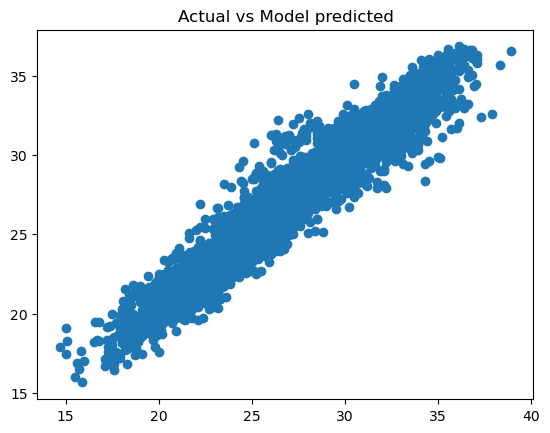

In [122]:
plt.scatter(y_test,y_pred)

plt.title('Actual vs Model predicted')
plt.show()